# **Photos To Van Gogh**

In [10]:
# Code adapted and modified from CycleGAN implementation by Eish Karan
# Original source: https://www.kaggle.com/code/eishkaran/cyclegan-implementation
# Changes were made to the ResNet and U-Net model architecture for our specific use-case and research objectives.

In [11]:
!pip install deepspeed

In [12]:
import glob
import os
import shutil
import deepspeed as ds
import matplotlib.pyplot as plt
import numpy as np
import pytorch_lightning as L
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from pytorch_lightning.utilities import CombinedLoader
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision.io import read_image
from torchvision.utils import make_grid, save_image
_ = L.seed_everything(0, workers=True)

# Data Preprocessing 

In [13]:
def show_img(img_tensor, nrow, title=""):
    img_tensor = img_tensor.detach().cpu() * 0.5 + 0.5
    img_grid = make_grid(img_tensor, nrow=nrow).permute(1, 2, 0)
    plt.figure(figsize=(10, 7))
    plt.imshow(img_grid)
    plt.axis("off")
    plt.title(title)
    plt.show()

In [14]:
class CustomTransform(object):
    def __init__(self, load_dim=286, target_dim=256):
        self.transform_train = T.Compose([
            T.Resize((load_dim, load_dim), antialias=True),
            T.RandomCrop((target_dim, target_dim)),
            T.RandomHorizontalFlip(p=0.5),
            T.ColorJitter(brightness=0.2, contrast=0.2,
                          saturation=0.2, hue=0.1),
        ])
        self.transform = T.Resize((target_dim, target_dim), antialias=True)   
    def __call__(self, img, stage):
        if stage == "fit":
            img = self.transform_train(img)
        else:
            img = self.transform(img)
        return img * 2 - 1

In [15]:
class CustomDataset(Dataset):
    def __init__(self, filenames, transform, stage):
        self.filenames = filenames
        self.transform = transform
        self.stage = stage
        
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        img_name = self.filenames[idx]
        img = read_image(img_name) / 255.0
        return self.transform(img, stage=self.stage)

In [16]:
DEBUG = False

DM_CONFIG = {    
    "van_gogh_dir": "/kaggle/input/van-gogh-paintings",
    "photo_dir": os.path.join("/kaggle/input/gan-getting-started/photo_jpg", "*.jpg"),
    
    "loader_config": {
        "num_workers": os.cpu_count(),
        "pin_memory": torch.cuda.is_available(),
    },
    "sample_size": 5,
    "batch_size": 1 if not DEBUG else 1,
}

In [17]:
def get_limited_image_paths(directory, limit_per_folder=40, specific_folders=None):
    all_paths = []
    for root, dirs, files in os.walk(directory):
        # Check if the current folder is one of the specific folders
        if specific_folders is not None:
            # Only proceed if the folder name matches one of the specific folders
            if not any(specific_folder in root for specific_folder in specific_folders):
                continue

        image_paths = [os.path.join(root, file) for file in files if file.endswith(".jpg")]
        all_paths.extend(image_paths[:limit_per_folder])
    return all_paths


class CustomDataModule(L.LightningDataModule):
    def __init__(
        self,
        van_gogh_dir,
        photo_dir, 
        loader_config,
        sample_size,
        batch_size,
    ):
        super().__init__()
        self.loader_config = loader_config
        self.sample_size = sample_size
        self.batch_size = batch_size       
        # Example of calling the function
        specific_folders = ['Aries', 'Auvers sur Oise', 'Saint Remy', 'Nuenen']  # Replace with actual folder names or patterns
        image_paths = get_limited_image_paths(van_gogh_dir, limit_per_folder=189, specific_folders=specific_folders)

        # store file paths
        self.van_gogh_filenames = sorted(image_paths)
        self.photo_filenames = sorted(glob.glob(photo_dir, recursive=True))[:2000]
        print(f"Number of Van Gogh images: {len(self.van_gogh_filenames)}")
        print(f"Number of photo images: {len(self.photo_filenames)}")

        
        # define transformations for image augmentation
        self.transform = CustomTransform()
        
    def setup(self, stage):
        if stage == "fit":
            self.train_van_gogh = CustomDataset(self.van_gogh_filenames, self.transform, stage)
            self.train_photo = CustomDataset(self.photo_filenames, self.transform, stage)
            
        if stage in ["fit", "test", "predict"]:
            # to be used for test and prediction datasets as well
            self.valid_photo = CustomDataset(self.photo_filenames, self.transform, None)
            
    def train_dataloader(self):
        loader_config = {
            "shuffle": True,
            "drop_last": True,
            "batch_size": self.batch_size,
            **self.loader_config,
        }
        loader_van_gogh = DataLoader(self.train_van_gogh, **loader_config)
        loader_photo = DataLoader(self.train_photo, **loader_config)
        loaders = {"van_gogh": loader_van_gogh, "photo": loader_photo}
        return CombinedLoader(loaders, mode="max_size_cycle")
    
    def val_dataloader(self):
        return DataLoader(
            self.valid_photo,
            batch_size=self.sample_size,
            **self.loader_config,
        )
    
    def test_dataloader(self):
        return self.val_dataloader()
    
    def predict_dataloader(self):
        return DataLoader(
            self.valid_photo,
            batch_size=self.batch_size,
            **self.loader_config,
        )

Number of Van Gogh images: 308
Number of photo images: 2000


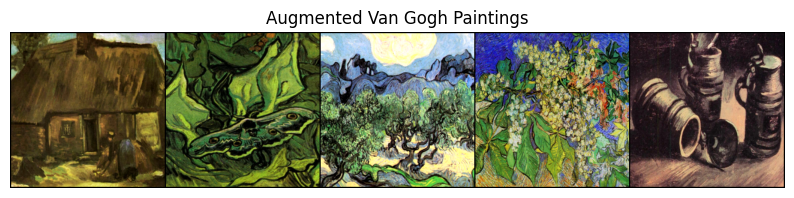

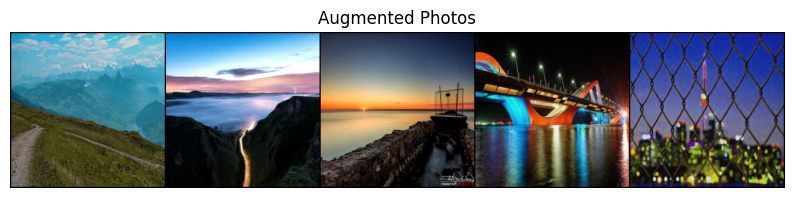

In [18]:
dm_sample = CustomDataModule(batch_size=5, **{k: v for k, v in DM_CONFIG.items() if k != "batch_size"})
dm_sample.setup("fit")
train_loader = dm_sample.train_dataloader()
imgs = next(iter(train_loader))
show_img(imgs[0]["van_gogh"], nrow=5, title="Augmented Van Gogh Paintings")
show_img(imgs[0]["photo"], nrow=5, title="Augmented Photos")

In [19]:
class Downsampling(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1, norm=True, lrelu=True):
        super().__init__()
        layers = [nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=not norm)]
        if norm:
            layers.append(nn.InstanceNorm2d(out_channels))
        if lrelu:
            layers.append(nn.LeakyReLU(0.2, inplace=True))
        else:
            layers.append(nn.ReLU(inplace=True))
        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)

In [20]:
class Upsampling(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1, output_padding=0, dropout=False):
        super().__init__()
        layers = [nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, output_padding, bias=False),
                  nn.InstanceNorm2d(out_channels),
                  nn.ReLU(inplace=True)]
        if dropout:
            layers.append(nn.Dropout(0.5))
        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)

In [21]:
class ResNetBlock(nn.Module):
    def __init__(self, dim):
        super(ResNetBlock, self).__init__()
        self.conv_block = self.build_conv_block(dim)

    def build_conv_block(self, dim):
        conv_block = [
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=False),
            nn.InstanceNorm2d(dim),
            nn.ReLU(True),

            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=False),
            nn.InstanceNorm2d(dim)
        ]
        return nn.Sequential(*conv_block)

    def forward(self, x):
        return x + self.conv_block(x)

In [22]:
class UNetGenerator(nn.Module):
    def __init__(self, hid_channels, in_channels, out_channels):
        super().__init__()
        self.down1 = Downsampling(in_channels, hid_channels)
        self.down2 = Downsampling(hid_channels, hid_channels * 2)
        self.down3 = Downsampling(hid_channels * 2, hid_channels * 4)
        self.down4 = Downsampling(hid_channels * 4, hid_channels * 8)

        self.bottleneck = Downsampling(hid_channels * 8, hid_channels * 8, norm=False)

        self.up1 = Upsampling(hid_channels * 8, hid_channels * 8, dropout=True)
        self.up2 = Upsampling(hid_channels * 16, hid_channels * 4, dropout=True)
        self.up3 = Upsampling(hid_channels * 8, hid_channels * 2)
        self.up4 = Upsampling(hid_channels * 4, hid_channels)

        self.out = nn.Sequential(
            nn.ConvTranspose2d(hid_channels * 2, out_channels, 4, 2, 1),
            nn.Tanh()
        )

    def forward(self, x):
        # Downsampling
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)

        bottleneck = self.bottleneck(d4)

        # Upsampling with skip connections
        u1 = self.up1(bottleneck)
        u1 = torch.cat([u1, d4], dim=1)

        u2 = self.up2(u1)
        u2 = torch.cat([u2, d3], dim=1)

        u3 = self.up3(u2)
        u3 = torch.cat([u3, d2], dim=1)

        u4 = self.up4(u3)
        u4 = torch.cat([u4, d1], dim=1)

        return self.out(u4)


class ResNetGenerator(nn.Module):
    def __init__(self, in_channels, out_channels, hid_channels=64, n_blocks=9, use_dropout=False):
        assert(n_blocks >= 0)
        super(ResNetGenerator, self).__init__()

        model = [nn.ReflectionPad2d(3),
                 nn.Conv2d(in_channels, hid_channels, kernel_size=7, padding=0, bias=False),
                 nn.InstanceNorm2d(hid_channels),
                 nn.ReLU(True)]

        # Downsampling
        n_downsampling = 2
        for i in range(n_downsampling):
            mult = 2**i
            model += [nn.Conv2d(hid_channels * mult, hid_channels * mult * 2, kernel_size=3, stride=2, padding=1, bias=False),
                      nn.InstanceNorm2d(hid_channels * mult * 2),
                      nn.ReLU(True)]

        # ResNet Blocks
        mult = 2**n_downsampling
        for i in range(n_blocks):
            model += [ResNetBlock(hid_channels * mult)]

        # Upsampling
        for i in range(n_downsampling):
            mult = 2**(n_downsampling - i)
            model += [nn.ConvTranspose2d(hid_channels * mult, int(hid_channels * mult / 2),
                                         kernel_size=3, stride=2,
                                         padding=1, output_padding=1,
                                         bias=False),
                      nn.InstanceNorm2d(int(hid_channels * mult / 2)),
                      nn.ReLU(True)]

        model += [nn.ReflectionPad2d(3)]
        model += [nn.Conv2d(hid_channels, out_channels, kernel_size=7, padding=0)]
        model += [nn.Tanh()]

        self.model = nn.Sequential(*model)

    def forward(self, input):
        return self.model(input)

    
def get_gen(gen_name, hid_channels, num_resblocks, in_channels=3, out_channels=3):
    if gen_name == "unet":
        return UNetGenerator(hid_channels, in_channels, out_channels)
    elif gen_name == "resnet":
        return ResNetGenerator(in_channels, out_channels, hid_channels, num_resblocks)
    else:
        raise NotImplementedError(f"Generator name '{gen_name}' not recognized.")

In [23]:
class Discriminator(nn.Module):
    def __init__(self, hid_channels, in_channels=3):
        super().__init__()
        self.block = nn.Sequential(
            Downsampling(in_channels, hid_channels, norm=False), # 64x128x128
            Downsampling(hid_channels, hid_channels*2), # 128x64x64
            Downsampling(hid_channels*2, hid_channels*4), # 256x32x32
            Downsampling(hid_channels*4, hid_channels*8, stride=1), # 512x31x31
            nn.Conv2d(hid_channels*8, 1, kernel_size=4, padding=1), # 1x30x30
        )
        
    def forward(self, x):
        return self.block(x)

In [24]:
class ImageBuffer(object):
    def __init__(self, buffer_size):
        self.buffer_size = buffer_size
        if self.buffer_size > 0:
            # the current capacity of the buffer
            self.curr_cap = 0
            # initialize buffer as empty list
            self.buffer = []
    
    def __call__(self, imgs):
        # the buffer is not used
        if self.buffer_size == 0:
            return imgs
        
        return_imgs = []
        for img in imgs:
            img = img.unsqueeze(dim=0)
            
            # fill buffer to maximum capacity
            if self.curr_cap < self.buffer_size:
                self.curr_cap += 1
                self.buffer.append(img)
                return_imgs.append(img)
            else:
                p = np.random.uniform(low=0., high=1.)
                
                # swap images between input and buffer with probability 0.5
                if p > 0.5:
                    idx = np.random.randint(low=0, high=self.buffer_size)
                    tmp = self.buffer[idx].clone()
                    self.buffer[idx] = img
                    return_imgs.append(tmp)
                else:
                    return_imgs.append(img)
        return torch.cat(return_imgs, dim=0)

In [25]:
MODEL_CONFIG = {
    # the type of generator, and the number of residual blocks if ResNet generator is used
    "gen_name": "resnet", # types: 'unet', 'resnet'
    "num_resblocks": 6,
    # the number of filters in the first layer for the generators and discriminators
    "hid_channels": 64,
    # using DeepSpeed's FusedAdam (currently GPU only) is slightly faster
    "optimizer": ds.ops.adam.FusedAdam if torch.cuda.is_available() else torch.optim.Adam,
    # the learning rate and beta parameters for the Adam optimizer
    "lr": 2e-4,
    "betas": (0.5, 0.999),
    # the weights used in the identity loss and cycle loss
    "lambda_idt": 0.5,
    "lambda_cycle": (10, 10), # (MPM direction, PMP direction)
    # the size of the buffer that stores previously generated images
    "buffer_size": 100,
    # the number of epochs for training
    "num_epochs": 18 if not DEBUG else 2,
    # the number of epochs before starting the learning rate decay
    "decay_epochs": 5 if not DEBUG else 1,
}

In [26]:
class CycleGAN(L.LightningModule):
    def __init__(
        self,
        gen_name,
        num_resblocks,
        hid_channels,
        optimizer,
        lr,
        betas,
        lambda_idt,
        lambda_cycle,
        buffer_size,
        num_epochs,
        decay_epochs,
    ):
        super().__init__()
        self.save_hyperparameters(ignore=["optimizer"])
        self.optimizer = optimizer
        self.automatic_optimization = False
        
        # define generators and discriminators
        self.gen_PM = get_gen(gen_name, hid_channels, num_resblocks)
        self.gen_MP = get_gen(gen_name, hid_channels, num_resblocks)
        self.disc_M = Discriminator(hid_channels)
        self.disc_P = Discriminator(hid_channels)
        
        # initialize buffers to store fake images
        self.buffer_fake_M = ImageBuffer(buffer_size)
        self.buffer_fake_P = ImageBuffer(buffer_size)
        
    def forward(self, img):
        return self.gen_PM(img)   
            
    def init_weights(self):
        def init_fn(m):
             if hasattr(m, 'weight') and isinstance(m.weight, nn.Parameter):
                nn.init.normal_(m.weight, 0.0, 0.02)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0.0)
        
        for net in [self.gen_PM, self.gen_MP, self.disc_M, self.disc_P]:
            net.apply(init_fn)
        
    def setup(self, stage):
        if stage == "fit":
            self.init_weights()
            print("Model initialized.")
            
    def get_lr_scheduler(self, optimizer):
        def lr_lambda(epoch):
            len_decay_phase = self.hparams.num_epochs - self.hparams.decay_epochs + 1.0
            curr_decay_step = max(0, epoch - self.hparams.decay_epochs + 1.0)
            val = 1.0 - curr_decay_step / len_decay_phase
            return max(0.0, val)
        
        return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)
    
    def configure_optimizers(self):
        opt_config = {
            "lr": self.hparams.lr,
            "betas": self.hparams.betas,
        }
        opt_gen = self.optimizer(
            list(self.gen_PM.parameters()) + list(self.gen_MP.parameters()),
            **opt_config,
        )
        opt_disc = self.optimizer(
            list(self.disc_M.parameters()) + list(self.disc_P.parameters()),
            **opt_config,
        )
        optimizers = [opt_gen, opt_disc]
        schedulers = [self.get_lr_scheduler(opt) for opt in optimizers]
        return optimizers, schedulers
        
    def adv_criterion(self, y_hat, y):
        return F.mse_loss(y_hat, y)
    
    def recon_criterion(self, y_hat, y):
        return F.l1_loss(y_hat, y)
    
    def get_adv_loss(self, fake, disc):
        fake_hat = disc(fake)
        real_labels = torch.ones_like(fake_hat)
        adv_loss = self.adv_criterion(fake_hat, real_labels)
        return adv_loss
    
    def get_idt_loss(self, real, idt, lambda_cycle):
        idt_loss = self.recon_criterion(idt, real)
        return self.hparams.lambda_idt * lambda_cycle * idt_loss
    
    def get_cycle_loss(self, real, recon, lambda_cycle):
        cycle_loss = self.recon_criterion(recon, real)
        return lambda_cycle * cycle_loss
    
    def get_gen_loss(self):
        # calculate adversarial loss
        adv_loss_PM = self.get_adv_loss(self.fake_M, self.disc_M)
        adv_loss_MP = self.get_adv_loss(self.fake_P, self.disc_P)
        total_adv_loss = adv_loss_PM + adv_loss_MP
        
        # calculate identity loss
        lambda_cycle = self.hparams.lambda_cycle
        idt_loss_MM = self.get_idt_loss(self.real_M, self.idt_M, lambda_cycle[0])
        idt_loss_PP = self.get_idt_loss(self.real_P, self.idt_P, lambda_cycle[1])
        total_idt_loss = idt_loss_MM + idt_loss_PP
        
        # calculate cycle loss
        cycle_loss_MPM = self.get_cycle_loss(self.real_M, self.recon_M, lambda_cycle[0])
        cycle_loss_PMP = self.get_cycle_loss(self.real_P, self.recon_P, lambda_cycle[1])
        total_cycle_loss = cycle_loss_MPM + cycle_loss_PMP
        
        # combine losses
        gen_loss = total_adv_loss + total_idt_loss + total_cycle_loss
        return gen_loss
    
    def get_disc_loss(self, real, fake, disc):
        # calculate loss on real images
        real_hat = disc(real)
        real_labels = torch.ones_like(real_hat)
        real_loss = self.adv_criterion(real_hat, real_labels)
        
        # calculate loss on fake images
        fake_hat = disc(fake.detach())
        fake_labels = torch.zeros_like(fake_hat)
        fake_loss = self.adv_criterion(fake_hat, fake_labels)
        
        # combine losses
        disc_loss = (fake_loss + real_loss) * 0.5
        return disc_loss
    
    def get_disc_loss_M(self):
        fake_M = self.buffer_fake_M(self.fake_M)
        return self.get_disc_loss(self.real_M, fake_M, self.disc_M)
    
    def get_disc_loss_P(self):
        fake_P = self.buffer_fake_P(self.fake_P)
        return self.get_disc_loss(self.real_P, fake_P, self.disc_P)
    
    def training_step(self, batch, batch_idx):
        self.real_M = batch["van_gogh"]
        self.real_P = batch["photo"]
        opt_gen, opt_disc = self.optimizers()

        # generate fake images
        self.fake_M = self.gen_PM(self.real_P)
        self.fake_P = self.gen_MP(self.real_M)
        
        # generate identity images
        self.idt_M = self.gen_PM(self.real_M)
        self.idt_P = self.gen_MP(self.real_P)
        
        # reconstruct images
        self.recon_M = self.gen_PM(self.fake_P)
        self.recon_P = self.gen_MP(self.fake_M)
    
        # train generators
        self.toggle_optimizer(opt_gen)
        gen_loss = self.get_gen_loss()        
        opt_gen.zero_grad()
        self.manual_backward(gen_loss)
        opt_gen.step()
        self.untoggle_optimizer(opt_gen)
        
        # train discriminators
        self.toggle_optimizer(opt_disc)
        disc_loss_M = self.get_disc_loss_M()
        disc_loss_P = self.get_disc_loss_P()
        opt_disc.zero_grad()
        self.manual_backward(disc_loss_M)
        self.manual_backward(disc_loss_P)
        opt_disc.step()
        self.untoggle_optimizer(opt_disc)
        
        # record training losses
        metrics = {
            "gen_loss": gen_loss,
            "disc_loss_M": disc_loss_M,
            "disc_loss_P": disc_loss_P,
        }
        self.log_dict(metrics, on_step=False, on_epoch=True, prog_bar=True)
        
    def validation_step(self, batch, batch_idx):
        self.display_results(batch, batch_idx, "validate")
    
    def test_step(self, batch, batch_idx):
        self.display_results(batch, batch_idx, "test")
        
    def predict_step(self, batch, batch_idx):
        return self(batch)
    
    def display_results(self, batch, batch_idx, stage):
        real_P = batch
        fake_M = self(real_P)
        
        if stage == "validate":
            title = f"Epoch {self.current_epoch+1}: Photo-to-Van-Gogh Translation"
        else:
            title = f"Sample {batch_idx+1}: Photo-to-Van-Gogh Translation"

        show_img(
            torch.cat([real_P, fake_M], dim=0),
            nrow=len(real_P),
            title=title,
        )
    
    def on_train_epoch_start(self):
        # record learning rates
        curr_lr = self.lr_schedulers()[0].get_last_lr()[0]
        self.log("lr", curr_lr, on_step=False, on_epoch=True, prog_bar=True)
        
    def on_train_epoch_end(self):
        # update learning rates
        for sch in self.lr_schedulers():
            sch.step()
        
        # print current state of epoch
        logged_values = self.trainer.progress_bar_metrics
        print(
            f"Epoch {self.current_epoch+1}",
            *[f"{k}: {v:.5f}" for k, v in logged_values.items()],
            sep=" - ",
        )
        
    def on_train_end(self):
        print("Training ended.")
        
    def on_predict_epoch_end(self):
        predictions = self.trainer.predict_loop.predictions
        num_batches = len(predictions)
        batch_size = predictions[0].shape[0]
        last_batch_diff = batch_size - predictions[-1].shape[0]
        print(f"Number of images generated: {num_batches*batch_size-last_batch_diff}.")

In [27]:
TRAIN_CONFIG = {
    "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
    
    # train on 16-bit precision
    "precision": "16-mixed" if torch.cuda.is_available() else 32,
    
    # train on single GPU
    "devices": 1,
    
    # save checkpoint only for last epoch by default
    "enable_checkpointing": True,
    
    # disable logging for simplicity
    "logger": False,
    
    # the number of epochs for training (we limit the number of train/predict batches during debugging)
    "max_epochs": MODEL_CONFIG["num_epochs"],
    "limit_train_batches": 1.0 if not DEBUG else 2,
    "limit_predict_batches": 1.0 if not DEBUG else 5,
    
    # the maximum amount of time for training, in case we exceed run-time of 5 hours
    "max_time": {"hours": 4, "minutes": 55},
    
    # use a small subset of photos for validation/testing (we limit here for flexibility)
    "limit_val_batches": 1,
    "limit_test_batches": 5,
    
    # disable sanity check before starting the training routine
    "num_sanity_val_steps": 0,
    
    # the frequency to visualize the progress of adding Van Gogh style
    "check_val_every_n_epoch": 2 if not DEBUG else 1,
}

Number of Van Gogh images: 308
Number of photo images: 2000
Model initialized.


Using /root/.cache/torch_extensions/py310_cu118 as PyTorch extensions root...
Creating extension directory /root/.cache/torch_extensions/py310_cu118/fused_adam...
Detected CUDA files, patching ldflags
Emitting ninja build file /root/.cache/torch_extensions/py310_cu118/fused_adam/build.ninja...
Building extension module fused_adam...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)


[1/3] /usr/local/cuda/bin/nvcc  -DTORCH_EXTENSION_NAME=fused_adam -DTORCH_API_INCLUDE_EXTENSION_H -DPYBIND11_COMPILER_TYPE=\"_gcc\" -DPYBIND11_STDLIB=\"_libstdcpp\" -DPYBIND11_BUILD_ABI=\"_cxxabi1016\" -I/opt/conda/lib/python3.10/site-packages/deepspeed/ops/csrc/includes -I/opt/conda/lib/python3.10/site-packages/deepspeed/ops/csrc/adam -isystem /opt/conda/lib/python3.10/site-packages/torch/include -isystem /opt/conda/lib/python3.10/site-packages/torch/include/torch/csrc/api/include -isystem /opt/conda/lib/python3.10/site-packages/torch/include/TH -isystem /opt/conda/lib/python3.10/site-packages/torch/include/THC -isystem /usr/local/cuda/include -isystem /opt/conda/include/python3.10 -D_GLIBCXX_USE_CXX11_ABI=1 -D__CUDA_NO_HALF_OPERATORS__ -D__CUDA_NO_HALF_CONVERSIONS__ -D__CUDA_NO_BFLOAT16_CONVERSIONS__ -D__CUDA_NO_HALF2_OPERATORS__ --expt-relaxed-constexpr -gencode=arch=compute_75,code=compute_75 -gencode=arch=compute_75,code=sm_75 --compiler-options '-fPIC' -O3 -DVERSION_GE_1_1 -DVERS

Loading extension module fused_adam...


Training: |          | 0/? [00:00<?, ?it/s]

Epoch 1 - lr: 0.00020 - gen_loss: 9.14202 - disc_loss_M: 0.26309 - disc_loss_P: 0.27005


Validation: |          | 0/? [00:00<?, ?it/s]

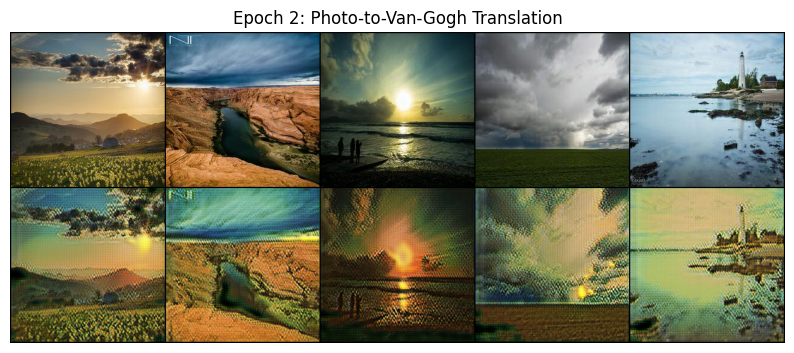

Epoch 2 - lr: 0.00020 - gen_loss: 7.78791 - disc_loss_M: 0.20533 - disc_loss_P: 0.21074
Epoch 3 - lr: 0.00020 - gen_loss: 7.27543 - disc_loss_M: 0.20714 - disc_loss_P: 0.23104


Validation: |          | 0/? [00:00<?, ?it/s]

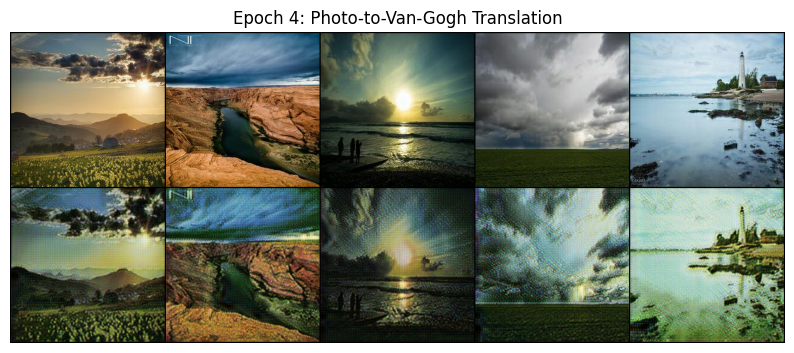

Epoch 4 - lr: 0.00020 - gen_loss: 6.92860 - disc_loss_M: 0.20206 - disc_loss_P: 0.21561
Epoch 5 - lr: 0.00020 - gen_loss: 6.78337 - disc_loss_M: 0.19735 - disc_loss_P: 0.20313


Validation: |          | 0/? [00:00<?, ?it/s]

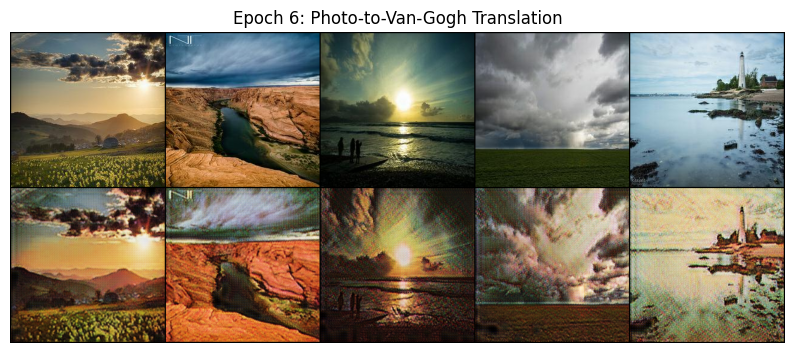

Epoch 6 - lr: 0.00019 - gen_loss: 6.53237 - disc_loss_M: 0.18541 - disc_loss_P: 0.19478
Epoch 7 - lr: 0.00017 - gen_loss: 6.28207 - disc_loss_M: 0.18053 - disc_loss_P: 0.19339


Validation: |          | 0/? [00:00<?, ?it/s]

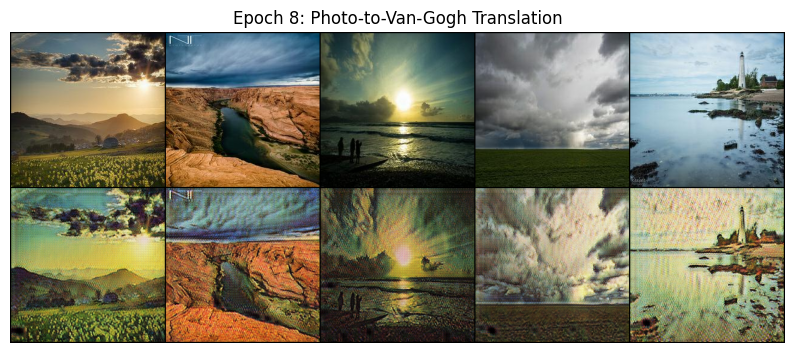

Epoch 8 - lr: 0.00016 - gen_loss: 6.10734 - disc_loss_M: 0.17411 - disc_loss_P: 0.18967
Epoch 9 - lr: 0.00014 - gen_loss: 5.97193 - disc_loss_M: 0.16954 - disc_loss_P: 0.18611


Validation: |          | 0/? [00:00<?, ?it/s]

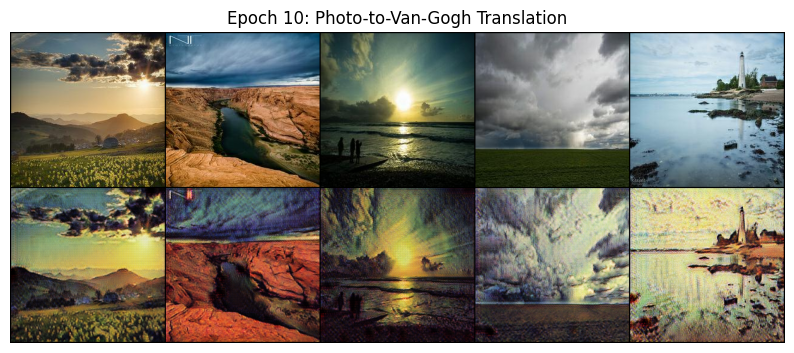

Epoch 10 - lr: 0.00013 - gen_loss: 5.81847 - disc_loss_M: 0.16355 - disc_loss_P: 0.18021
Epoch 11 - lr: 0.00011 - gen_loss: 5.64626 - disc_loss_M: 0.16144 - disc_loss_P: 0.18073


Validation: |          | 0/? [00:00<?, ?it/s]

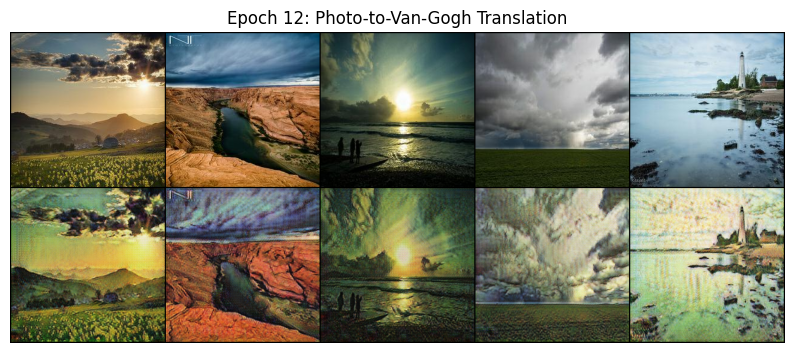

Epoch 12 - lr: 0.00010 - gen_loss: 5.55335 - disc_loss_M: 0.15802 - disc_loss_P: 0.17501
Epoch 13 - lr: 0.00009 - gen_loss: 5.45092 - disc_loss_M: 0.15576 - disc_loss_P: 0.16859


Validation: |          | 0/? [00:00<?, ?it/s]

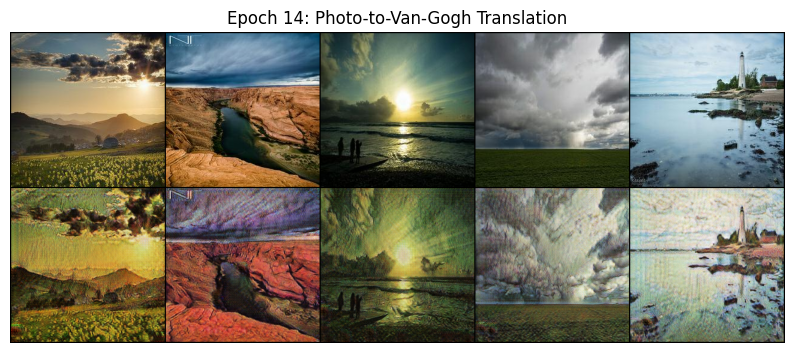

Epoch 14 - lr: 0.00007 - gen_loss: 5.33458 - disc_loss_M: 0.15517 - disc_loss_P: 0.16372
Epoch 15 - lr: 0.00006 - gen_loss: 5.20352 - disc_loss_M: 0.14971 - disc_loss_P: 0.15787


Validation: |          | 0/? [00:00<?, ?it/s]

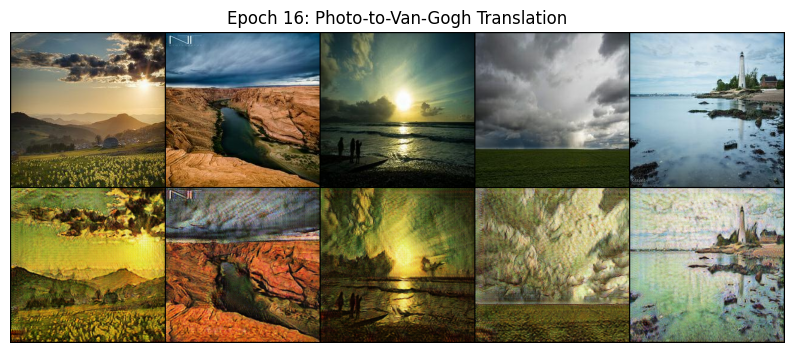

Epoch 16 - lr: 0.00004 - gen_loss: 5.08769 - disc_loss_M: 0.14646 - disc_loss_P: 0.15606
Epoch 17 - lr: 0.00003 - gen_loss: 5.02617 - disc_loss_M: 0.14429 - disc_loss_P: 0.14891


Validation: |          | 0/? [00:00<?, ?it/s]

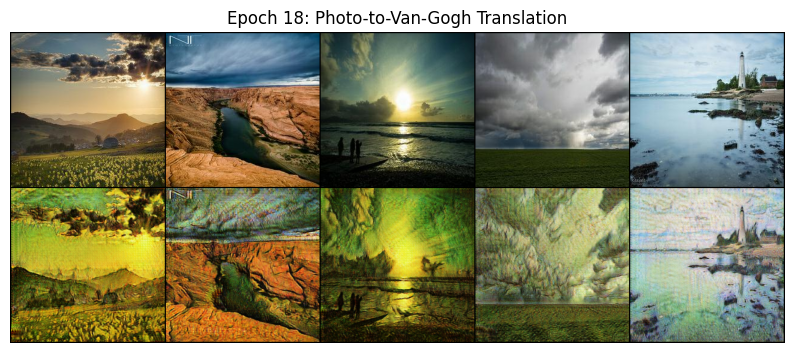

Epoch 18 - lr: 0.00001 - gen_loss: 4.94066 - disc_loss_M: 0.14049 - disc_loss_P: 0.14878
Training ended.


In [28]:
dm = CustomDataModule(**DM_CONFIG)
model = CycleGAN(**MODEL_CONFIG)
trainer = L.Trainer(**TRAIN_CONFIG)
trainer.fit(model, datamodule=dm)

**Testing the model on other sample photos**

Testing: |          | 0/? [00:00<?, ?it/s]

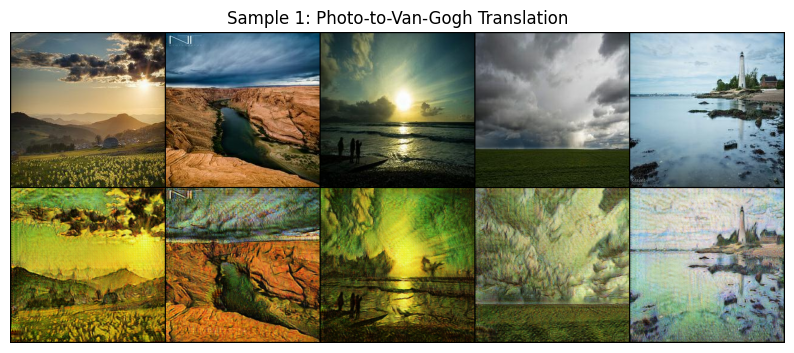

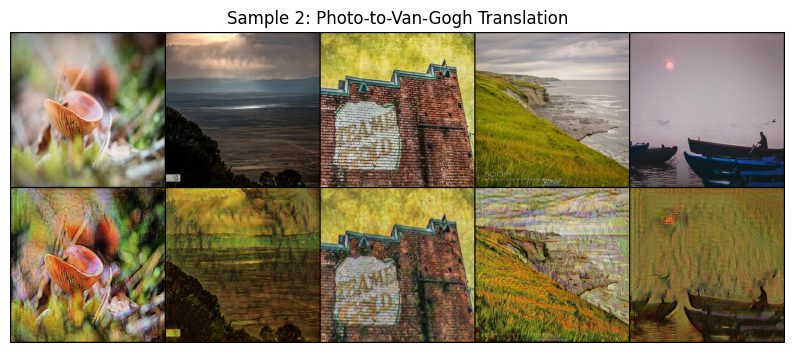

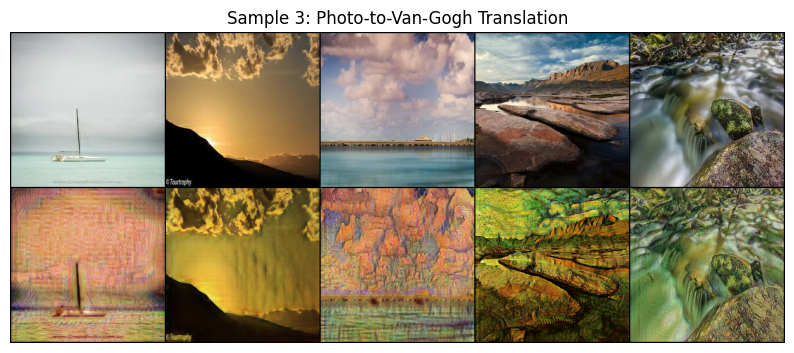

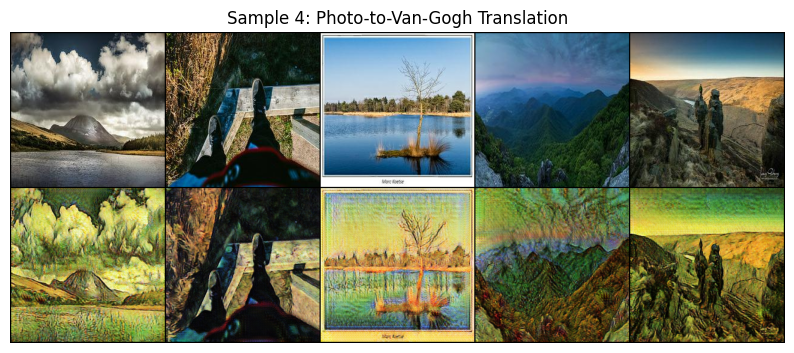

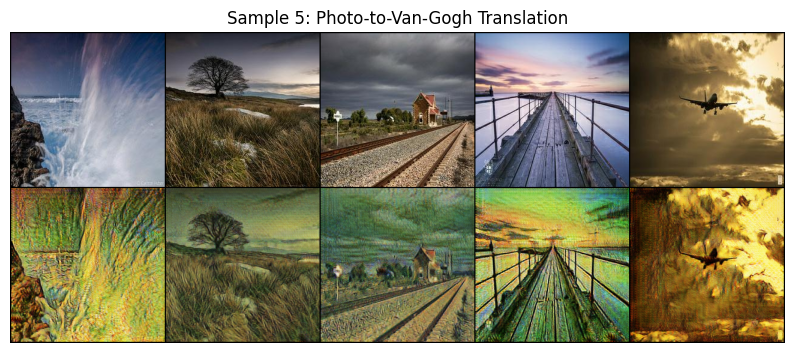

In [29]:
_ = trainer.test(model, datamodule=dm)

In [30]:
predictions = trainer.predict(model, datamodule=dm)

Predicting: |          | 0/? [00:00<?, ?it/s]

Number of images generated: 2000.


In [31]:
os.makedirs("../images", exist_ok=True)
idx = 0
for tensor in predictions:
    for van_gogh in tensor:
        save_image(
            van_gogh.float().squeeze() * 0.5 + 0.5, 
            fp=f"../images/{idx}.jpg",
        )
        idx += 1

shutil.make_archive("/kaggle/working/images", "zip", "/kaggle/images")

'/kaggle/working/images.zip'